<font color="black"><b><h1>Topic Modeling With Twitter Tweets</h1></b></font>


## Table of contents <a class="anchor" id="0.1"></a>

1. [Objectives](#1)
2. [Data Identification](#2)
3. [Metadata](#3)
4. [Import Libraries](#4)
5. [General Functions](#5)
6. [Web Scarping](#6)
7. [Merge All CSVs into One File](#7)
8. [Read Combined CSV](#8)
9. [Data Cleaning](#9)
10. [Exploratory Data Analysis (EDA)](#10)
11. [Pandas Profiling](#11)
12. [Feature Engineering](#12)
13. [TF-IDF](#13)
14. [Incremental PCA](#14)
15. [Clustering](#15)
    1. [K-Means](#15.1)
    2. [DBSCAN](#15.2)


## Objectives <a class="anchor" id="1"></a>

Topic modeling is an unsupervised machine learning technique that’s capable of scanning a set of documents, detecting word and phrase patterns within them, and automatically clustering word groups and similar expressions that best characterize a set of documents.

## Data Identification <a class="anchor" id="2"></a>
Dataset Structure after web scarping.<br><br>

|COLUMN| DESCRIPTION|
|:--|:--|
|user_id|User ID of the User|
|tweet_id|Tweet ID|
|keyword|Domain of the Tweet|
|user_name|User Name of the Tweet|
|tweet_date|Timestamp of the tweet|
|tweet_text|Data of the Tweet|
|comment|Total comment of the Tweet|
|retweet|Total retweet of the Tweet|
|like|Total like of the Tweet|

## Metadata <a class="anchor" id="3"></a>

**File descriptions**

education.csv - This contains those tweets which have 'education' keyword. <br>
fashion.csv - This contains those tweets which have 'fashion' keyword. <br>
gaming.csv - This contains those tweets which have 'gaming' keyword. <br>
health.csv - This contains those tweets which have 'health' keyword. <br>
politics.csv - This contains those tweets which have 'politics' keyword. <br> 
technology.csv - This contains those tweets which have 'technology' keyword. <br>

## Import Libraries <a class="anchor" id="4"></a>

In [1]:
import pandas as pd
import numpy as np

import random
import urllib.request
from bs4 import BeautifulSoup
from datetime import datetime, timedelta
from datetime import date

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
import plotly.io as pio

import nltk
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import IncrementalPCA
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

from spellchecker import SpellChecker

from langdetect import detect

from wordcloud import WordCloud, STOPWORDS

import statistics

import re

import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

import ydata_profiling as pp

english_words = set(words.words())

stopwords = stopwords.words('english')

spell = SpellChecker(language='en')

lemmatizer = WordNetLemmatizer()

pyo.init_notebook_mode(connected=True)

pio.renderers.default='notebook'

# General Functions <a class="anchor" id="5"></a>

In [2]:
def get_next_page_link(tweets_html):
    """Get Next page link

    Args:
        tweets_html (HTML): HTML object of the page

    Returns:
        string: Next page Link
    """
    try:
        items = list(set([content.text for content in tweets_html.find_all("h2", class_="timeline-end")]))
        if items:
            return None
        items = tweets_html.find_all("div", class_="show-more")
        for item in items:
            for url in item.find_all("a"):
                if url.get('href').startswith("?f="):
                    return url.get('href')
    except Exception as ex:
        pass

    return None

In [3]:
def fetch_data(tweet_url, keys):
    """fetch Data From Online Sources

    Args:
        tweet_url (string): Tweet Page URL
        keys (string): Keyword of the Tweet

    Returns:
        List: Fecthed Tweets
    """
    USER_AGENTS = '''Mozilla/5.0 (Windows NT 6.1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/41.0.2228.0 Safari/537.36
        Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/41.0.2227.1 Safari/537.36
        Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/41.0.2227.0 Safari/537.36
        Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/41.0.2227.0 Safari/537.36'''.split('\n')
    tweet_list = []
    while tweet_url != None:
        print("Page URL:",tweet_url)
        user_agent = random.choice(USER_AGENTS)
        headers = {"User-Agent": user_agent}
        req = urllib.request.Request(tweet_url, headers=headers)
        resp = urllib.request.urlopen(req)
        resp_data = str(resp.read())
        soap = BeautifulSoup(resp_data, "html.parser")
        body = soap.find_all("div", class_="timeline")
        for tweets in body:
            for content in tweets.find_all("div", class_="timeline-item"):
                try:
                    user_details = {"user_id" : np.nan, "tweet_id" : np.nan, "keyword" : keys, "user_name" : np.nan, "tweet_date" : np.nan, "tweet_text" : np.nan, "comment" : 0, "retweet" : 0, "like" : 0}
                    link = content.find("a", class_ = "tweet-link")
                    user_id = link['href'].split("/")[1]
                    tweet_id = link['href'].split("/")[-1][:-2]
                    user_details["user_id"] = user_id
                    user_details["tweet_id"] = tweet_id
                    
                    username_full_name = content.find("a", class_ = "fullname")
                    user_details["user_name"] = username_full_name.getText()
                    
                    tweet_date_obj = content.find("span", class_ = "tweet-date")
                    anchor_tag = tweet_date_obj.find("a")['title'].encode().decode('utf-8')
                    tweet_date = re.sub(r"[\\]*x[0-9a-z]*","", anchor_tag)
                    tweet_date = tweet_date.replace("  ", " ")
                    user_details["tweet_date"] = datetime.strptime(tweet_date, '%b %d, %Y %I:%M %p %Z')
                    
                    tweet_body_obj = content.find("div", class_ = "tweet-content media-body")
                    
                    user_details["tweet_text"] = tweet_body_obj.getText()
                    all_container = content.find_all("div", class_ = "icon-container")
                    
                    for index, value in enumerate(all_container):
                        if index == 0:
                            if value.getText() != "":
                                user_details["comment"] = int(value.getText().strip().replace(",", ""))
                        elif index == 1:
                            if value.getText() != "":
                                user_details["retweet"] = int(value.getText().strip().replace(",", ""))
                        elif index == 3:
                            if value.getText() != "":
                                user_details["like"] = int(value.getText().strip().replace(",", ""))
                    tweet_list.append(user_details)
                except Exception as e:
                    pass
        tweet_url = get_next_page_link(soap)
        if tweet_url:
            tweet_url = f"https://nitter.net/search{tweet_url.replace('/search?', '?')}"
    return tweet_list

In [4]:
def check_null_values(data):
    """Check Null Values of the DataFrame

    Args:
        data (DataFrame): DataFrame Object

    Returns:
        Object : Return Complete report of the null values
    """
    return data.isnull().sum()

In [5]:
def check_duplicate(data):
    """Check the Duplicate value of the dataframe

    Args:
        data (DataFrame): DataFrame Object

    Returns:
        Int: Count of Duplicate Values
    """
    return len(data[data.duplicated()])

In [6]:
def remove_duplicate(df, column):
    """Remove Duplicate Value from the DataFrame

    Args:
        data (DataFrame): DataFrame Object

    Returns:
        DataFrame: DataFrame which does not contain duplicate values
    """
    droping_index = df[df[column].duplicated()==True].index
    df = df.drop(droping_index)
    return df

In [7]:
def remove_special_char(string):
    """Remove Special Character From the STring

    Args:
        string (str): String of the DataFrame

    Returns:
        String: Special Charactered Removed String
    """
    result = re.sub(r"[\\]*xc[2-3][\\]*x[0-9a-z]*|[\\]*x[0-9a-z]*", "", string)
    result = result.replace(r"\'", "'")
    result = result.replace(r"\n", " ")
    result = result.replace("  ", " ")

    if result == '':
        return np.nan
        
    return result

In [8]:
def remove_punctuations(data):
    """Remove Punctuations from the DataFrame

    Args:
        data (DataFrame): DataFrame Obejct

    Returns:
        DataFrame: Cleaned DataFrame
    """
    data['tweet_text'] = data['tweet_text'].str.replace('[^\w\s]','')
    return data

In [9]:
def check_language(string):
    """Check Language of the Tweet

    Args:
        string (String): String of the DataFrame

    Returns:
        String: Detected Language
    """
    try:
        lang = detect(string)
        return lang
    except Exception as e:
        return np.nan

In [10]:
def remove_links(string):
    """Remove Linked from the Tweets

    Args:
        string (String): String of the DataFrame

    Returns:
        String: Cleaned String
    """
    data = re.sub('[^ ]+\.[^ ]+','',string)
    return data

In [11]:
def lower_stopwords(data):
    """Convert String into Lower case and remove stopwords

    Args:
        data (DataFrame): DataFrame Object

    Returns:
        DataFrame: Processed DataFrame
    """
    try:
        data['tweet_text'] = data['tweet_text'].map(lambda x: ' '.join([w.lower() for w in x.split() if w.lower() not in stopwords]))
    except:
        pass
    return data

In [12]:
def make_disributions(data, category):
    """Make Distribution of the DataFrame

    Args:
        data (DataFrame): DataFrame Object
        category (String): Column Name
    """
    color_sequence = ['red', 'green', 'blue']
    numeric_columns = ['like', 'retweet', 'comment']
    df1 = data[data['keyword'] == category]
    for i, col in enumerate(numeric_columns):
        fig = go.Figure()
        fig.add_trace(go.Histogram(x=data[col], name=col, marker_color=color_sequence[i]))
        fig.update_xaxes(title_text=col, range=[0, 30])
        fig.update_yaxes(title_text='Frequency', range=[0, 1000])
        fig.update_layout(title=f'Distribution of {col}', showlegend=False)
        fig.show()

In [13]:
def process_text(text):
    """Word Tokenize, Spell Checker and Remove Stop words.

    Args:
        text (String): String of the DataFrame

    Returns:
        String: Processed String
    """
    words_list = nltk.word_tokenize(text)
    english_words_list = [word for word in words_list if word in spell and word not in stopwords]
    base_words_list = [lemmatizer.lemmatize(word.lower()) for word in english_words_list]
    return ' '.join(base_words_list)

In [14]:
def check_tweet_length(string):
    """Check the Length of the tweet

    Args:
        string (String): String of the DataFrame

    Returns:
        int: Length of the Tweet
    """
    return len(string.split())

In [15]:
def detect_outliers(data, feat):
    """Detect Outlier and plot Boxplot of the column

    Args:
        data (DataFrame): DataFrame Object
        feat (String): Column Name
    """
    feat = data[feat]
    
    Q1 = feat.quantile(0.25)
    Q3 = feat.quantile(0.75)

    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[(feat < lower_bound) | (feat > upper_bound)]

    print("Number of outliers:", len(outliers))
    
    fig = px.box(data, y=feat)
    pyo.iplot(fig)

In [16]:
def remove_outliers(data, feat):
    """Remove Outliers

    Args:
        data (DataFrame): DataFrame Object
        feat (String): Column Name

    Returns:
        DataFrame: Outlier Removed DataFrame
    """
    feat = data[feat]
    
    Q1 = feat.quantile(0.25)
    Q3 = feat.quantile(0.75)

    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[(feat < lower_bound) | (feat > upper_bound)].index
    data = data.drop(outliers)
    return data

# Web Scarping <a class="anchor" id="6"></a>

Web scraping has emerged as a powerful technique to extract valuable data from websites, offering researchers and analysts access to a wealth of information. While Twitter serves as a popular platform for real-time updates and discussions, its API limitations often restrict the full scope of data retrieval. To overcome these constraints, we turned to Nitter, which is a free and open-source front-end service for Twitter that offers a lightweight alternative for accessing Twitter content. In this report, we delve into the process of web scraping using Nitter and the benefits it offers for obtaining comprehensive Twitter data.

In [17]:
key_words = ["fashion", "gaming", "health", "technology", "politics", "education"]
for keys in key_words[1:]:
    empty_list = []
    start_date = date(2023, 7, 15)
    for i in range(1, 10):
        next_date = start_date + timedelta(days=1)
        url = f"https://nitter.net/search?f=tweets&q=%23{keys}&e-replies=on&e-nativeretweets=on&since={start_date}&until={next_date}"
        tweet_data = fetch_data(url, keys)
        for i in tweet_data:
            empty_list.append(i)
        start_date = next_date
    tweet_df = pd.DataFrame(empty_list)
    tweet_df.to_csv(f"{keys.lower()}.csv", index=False)

Page URL: https://nitter.net/search?f=tweets&q=%23gaming&e-replies=on&e-nativeretweets=on&since=2023-07-15&until=2023-07-16


HTTPError: HTTP Error 403: Forbidden

# Merge All CSVs into One File <a class="anchor" id="7"></a>

In [18]:
files = ['education.csv', 'fashion.csv', 'gaming.csv', 'health.csv', 'politics.csv', 'technology.csv']

In [19]:
df = pd.DataFrame()

for file in files:
    data = pd.read_csv(file)
    df = pd.concat([df, data], axis=0)

df.to_csv('Twitter_tweets.csv', index=False)

# Read Combined CSV <a class="anchor" id="8"></a>

In [20]:
dataset = pd.read_csv('Twitter_tweets.csv', parse_dates=['tweet_date'])

### Check the first 5 rows of the dataset

In [21]:
dataset.head()

,user_id,tweet_id,keyword,user_name,tweet_date,tweet_text,comment,retweet,like
0,DataDotcoaza,1680365782889385985,education,DataDotCoaZa,2023-07-15 23:56:00,Eskom Bursaries 2024 \xe2\x80\x93 All Bursarie...,0,0,0
1,tmj_sfo_edu,1680365157539778561,education,SF Education Jobs,2023-07-15 23:54:00,Oakland Unified School District is looking for...,0,0,0
2,ansar_relief,1680364821517324289,education,Ansar Relief Foundation,2023-07-15 23:52:00,Witnessing the growth and development of orpha...,0,0,0
3,mashooque4u2016,1680364098201034754,education,Mashooque.Ali,2023-07-15 23:49:00,rb.gy/j8jr5\nBuild Stable Diffusion AI SAAS Ap...,0,0,0
4,apneaap,1680363853543088129,education,Apne Aap,2023-07-15 23:48:00,"This quarter, we are proud to have equipped 39...",0,0,0


### As we are performing clustering so user_id and user_name column is not required so we are dropping that column

In [22]:
dataset = dataset.drop(['user_id','user_name'], axis=1)

In [23]:
dataset.head()

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like
0,1680365782889385985,education,2023-07-15 23:56:00,Eskom Bursaries 2024 \xe2\x80\x93 All Bursarie...,0,0,0
1,1680365157539778561,education,2023-07-15 23:54:00,Oakland Unified School District is looking for...,0,0,0
2,1680364821517324289,education,2023-07-15 23:52:00,Witnessing the growth and development of orpha...,0,0,0
3,1680364098201034754,education,2023-07-15 23:49:00,rb.gy/j8jr5\nBuild Stable Diffusion AI SAAS Ap...,0,0,0
4,1680363853543088129,education,2023-07-15 23:48:00,"This quarter, we are proud to have equipped 39...",0,0,0


### Check the shape of the dataset

In [24]:
dataset.shape

(116397, 7)

### Get the insignt of the columns of the dataset

In [25]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116397 entries, 0 to 116396
Data columns (total 7 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   tweet_id    116397 non-null  int64         
 1   keyword     116397 non-null  object        
 2   tweet_date  116397 non-null  datetime64[ns]
 3   tweet_text  116397 non-null  object        
 4   comment     116397 non-null  int64         
 5   retweet     116397 non-null  int64         
 6   like        116397 non-null  int64         
dtypes: datetime64[ns](1), int64(4), object(2)
memory usage: 6.2+ MB


### Dataset mean, mode, and median of the numerical columns

In [26]:
dataset.describe()

,tweet_id,comment,retweet,like
count,1.163970e+05,116397.000000,116397.000000,116397.000000
mean,1.681808e+18,0.555272,1.280626,5.321220
std,6.959251e+14,11.482250,35.319531,312.146063
min,1.680348e+18,0.000000,0.000000,0.000000
25%,1.681212e+18,0.000000,0.000000,0.000000
50%,1.681691e+18,0.000000,0.000000,0.000000
75%,1.682374e+18,0.000000,0.000000,2.000000
max,1.683266e+18,2157.000000,9439.000000,104022.000000


# Data Cleaning <a class="anchor" id="9"></a>

### Null values of the whole dataset. it does not have any null values.

In [27]:
check_null_values(dataset)

tweet_id      0
keyword       0
tweet_date    0
tweet_text    0
comment       0
retweet       0
like          0
dtype: int64

### Looking the duplicate values of the entire dataset. But their is a possibility of the getting duplicate values if people do retweet. So we checked duplicate value by tweet text.

Duplicates in the dataset can arise due to various reasons, such as data collection errors or repeated entries. However, in this dataset, the duplicates were due to the retweets as the text from one tweet will remain same while posting retweets. Thus removing these duplicates is essential cleaning step.


In [28]:
check_duplicate(dataset)

0

### Check duplicate value by tweet text. We have around 8000 duplicate value as our dataset is much big so we can drop duplicate rows.

In [29]:
check_duplicate(dataset["tweet_text"])

8379

In [30]:
check_duplicate(dataset["tweet_id"])

1236

### Delete those rows which have repeated tweet text

In [31]:
dataset = remove_duplicate(dataset, "tweet_text")

In [32]:
dataset.head()

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like
0,1680365782889385985,education,2023-07-15 23:56:00,Eskom Bursaries 2024 \xe2\x80\x93 All Bursarie...,0,0,0
1,1680365157539778561,education,2023-07-15 23:54:00,Oakland Unified School District is looking for...,0,0,0
2,1680364821517324289,education,2023-07-15 23:52:00,Witnessing the growth and development of orpha...,0,0,0
3,1680364098201034754,education,2023-07-15 23:49:00,rb.gy/j8jr5\nBuild Stable Diffusion AI SAAS Ap...,0,0,0
4,1680363853543088129,education,2023-07-15 23:48:00,"This quarter, we are proud to have equipped 39...",0,0,0


### Check duplicate values afterwards

In [33]:
check_duplicate(dataset["tweet_text"])

0

In [34]:
check_duplicate(dataset["tweet_id"])

0

### Tweet text has special character so we need to remove special characters from the text.

There are various special characters in the tweets including some hex values, new lines and so on. These special characters were removed using regular expression.

In [35]:
dataset['tweet_text'] = dataset['tweet_text'].apply(lambda x: remove_special_char(x))

In [36]:
dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like
0,1680365782889385985,education,2023-07-15 23:56:00,Eskom Bursaries 2024 All Bursaries SA #educati...,0,0,0
1,1680365157539778561,education,2023-07-15 23:54:00,Oakland Unified School District is looking for...,0,0,0
2,1680364821517324289,education,2023-07-15 23:52:00,Witnessing the growth and development of orpha...,0,0,0
3,1680364098201034754,education,2023-07-15 23:49:00,rb.gy/j8jr5 Build Stable Diffusion AI SAAS App...,0,0,0
4,1680363853543088129,education,2023-07-15 23:48:00,"This quarter, we are proud to have equipped 39...",0,0,0
...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,New UK law could spark 'default surveillance o...,0,0,0
116392,1682903749302566913,technology,2023-07-23 00:01:00,China Cloud Computing Firms Raise Concern for ...,0,0,0
116393,1682903529743339520,technology,2023-07-23 00:00:00,Z3X MST Tool v2.6.1.4 Free Download Updated Ve...,0,0,1
116394,1682903355658764288,technology,2023-07-23 00:00:00,Huawei's Bold Move: Strengthening Phone Market...,0,0,2


In [37]:
check_null_values(dataset)

tweet_id      0
keyword       0
tweet_date    0
tweet_text    0
comment       0
retweet       0
like          0
dtype: int64

### Tweet text has some links of the other websites so we need to remove links.

Since the tweets may contain links of some external sources redirecting to either text or Youtube videos, they should be removed for better extraction of only useful words related to particular keywords.


In [38]:
dataset['tweet_text'] = dataset['tweet_text'].apply(lambda x: remove_links(x))

In [39]:
dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like
0,1680365782889385985,education,2023-07-15 23:56:00,Eskom Bursaries 2024 All Bursaries SA #educati...,0,0,0
1,1680365157539778561,education,2023-07-15 23:54:00,Oakland Unified School District is looking for...,0,0,0
2,1680364821517324289,education,2023-07-15 23:52:00,Witnessing the growth and development of orpha...,0,0,0
3,1680364098201034754,education,2023-07-15 23:49:00,Build Stable Diffusion AI SAAS Application #h...,0,0,0
4,1680363853543088129,education,2023-07-15 23:48:00,"This quarter, we are proud to have equipped 39...",0,0,0
...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,New UK law could spark 'default surveillance o...,0,0,0
116392,1682903749302566913,technology,2023-07-23 00:01:00,China Cloud Computing Firms Raise Concern for ...,0,0,0
116393,1682903529743339520,technology,2023-07-23 00:00:00,Z3X MST Tool Free Download Updated Version He...,0,0,1
116394,1682903355658764288,technology,2023-07-23 00:00:00,Huawei's Bold Move: Strengthening Phone Market...,0,0,2


### Remove Punctuations

The symbols like ‘@’ and ‘#’ were initially retained to check the mentions and hashtags. In addition, after removing special characters, the amount of digits increased which will create separate columns during TF-IDF which is irrelevant thus, everything except alphabets and spaces were removed.


In [40]:
dataset = remove_punctuations(dataset)

In [41]:
dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like
0,1680365782889385985,education,2023-07-15 23:56:00,Eskom Bursaries 2024 All Bursaries SA educatio...,0,0,0
1,1680365157539778561,education,2023-07-15 23:54:00,Oakland Unified School District is looking for...,0,0,0
2,1680364821517324289,education,2023-07-15 23:52:00,Witnessing the growth and development of orpha...,0,0,0
3,1680364098201034754,education,2023-07-15 23:49:00,Build Stable Diffusion AI SAAS Application he...,0,0,0
4,1680363853543088129,education,2023-07-15 23:48:00,This quarter we are proud to have equipped 394...,0,0,0
...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,New UK law could spark default surveillance of...,0,0,0
116392,1682903749302566913,technology,2023-07-23 00:01:00,China Cloud Computing Firms Raise Concern for ...,0,0,0
116393,1682903529743339520,technology,2023-07-23 00:00:00,Z3X MST Tool Free Download Updated Version He...,0,0,1
116394,1682903355658764288,technology,2023-07-23 00:00:00,Huaweis Bold Move Strengthening Phone Market w...,0,0,2


### Tweet text has multiple language so we need to identify the language first and then we check the frequency of the all languages.

Since there was no filtering used during collection, there was a mix of tweets written in different languages. Initially, the googletrans Python package was going to be used to translate these tweets. The majority of the tweets were already in English, it was observed. As a result, only the tweets in the English language were kept for further analysis.


In [42]:
dataset['tweet_language'] = dataset['tweet_text'].apply(lambda x: check_language(x))

In [43]:
dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like,tweet_language
0,1680365782889385985,education,2023-07-15 23:56:00,Eskom Bursaries 2024 All Bursaries SA educatio...,0,0,0,en
1,1680365157539778561,education,2023-07-15 23:54:00,Oakland Unified School District is looking for...,0,0,0,en
2,1680364821517324289,education,2023-07-15 23:52:00,Witnessing the growth and development of orpha...,0,0,0,en
3,1680364098201034754,education,2023-07-15 23:49:00,Build Stable Diffusion AI SAAS Application he...,0,0,0,en
4,1680363853543088129,education,2023-07-15 23:48:00,This quarter we are proud to have equipped 394...,0,0,0,en
...,...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,New UK law could spark default surveillance of...,0,0,0,en
116392,1682903749302566913,technology,2023-07-23 00:01:00,China Cloud Computing Firms Raise Concern for ...,0,0,0,en
116393,1682903529743339520,technology,2023-07-23 00:00:00,Z3X MST Tool Free Download Updated Version He...,0,0,1,en
116394,1682903355658764288,technology,2023-07-23 00:00:00,Huaweis Bold Move Strengthening Phone Market w...,0,0,2,en


### Most of the tweets are in english so we can keep english tweets and remove other language tweets.

In [44]:
english_dataset = dataset[dataset["tweet_language"] == "en"]

In [45]:
english_dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like,tweet_language
0,1680365782889385985,education,2023-07-15 23:56:00,Eskom Bursaries 2024 All Bursaries SA educatio...,0,0,0,en
1,1680365157539778561,education,2023-07-15 23:54:00,Oakland Unified School District is looking for...,0,0,0,en
2,1680364821517324289,education,2023-07-15 23:52:00,Witnessing the growth and development of orpha...,0,0,0,en
3,1680364098201034754,education,2023-07-15 23:49:00,Build Stable Diffusion AI SAAS Application he...,0,0,0,en
4,1680363853543088129,education,2023-07-15 23:48:00,This quarter we are proud to have equipped 394...,0,0,0,en
...,...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,New UK law could spark default surveillance of...,0,0,0,en
116392,1682903749302566913,technology,2023-07-23 00:01:00,China Cloud Computing Firms Raise Concern for ...,0,0,0,en
116393,1682903529743339520,technology,2023-07-23 00:00:00,Z3X MST Tool Free Download Updated Version He...,0,0,1,en
116394,1682903355658764288,technology,2023-07-23 00:00:00,Huaweis Bold Move Strengthening Phone Market w...,0,0,2,en


### Convert the tweet text into lower case and remove the stopword.

Stopwords = Stop words, such as frequently used words like "the" or "and," are meaningless. We use RegEx methods, which offer detailed recommendations for finding and replacing text patterns, to remove these items from the text successfully. Additionally, to avoid duplication and to make comparisons more straightforward, we use normalization techniques by changing all terms to lowercase.

In [46]:
english_dataset = lower_stopwords(english_dataset)

C:\Users\dmaka\AppData\Local\Temp\ipykernel_34336\680602472.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Exploratory Data Analysis (EDA) <a class="anchor" id="10"></a>

### Create the copy of the main dataset for the Exploratory Data Analysis.

In [47]:
eda_dataset = dataset.copy()

### Count the Total number of tweets by keyowords to check the equality of the dataset.

In [48]:
tweet_count_by_category = eda_dataset['keyword'].value_counts().reset_index()
tweet_count_by_category.columns = ['Category', 'TweetCount']

fig = px.bar(tweet_count_by_category, x='Category', y='TweetCount', color='Category',
             labels={'Category': 'Category', 'TweetCount': 'Number of Tweets'},
             title='Number of Tweets counts according to each category',
             color_discrete_sequence=px.colors.qualitative.Dark2)

pyo.iplot(fig)

### Count the Total number of tweets by keyowords day by day. From the July 17 to July 19 fashion keyword has highest number of tweets.

In [49]:
tweet_count_by_date_category = eda_dataset.groupby(['tweet_date','keyword']).size().reset_index(name='Count')

tweet_count_by_date_category['tweet_date'] = pd.to_datetime(tweet_count_by_date_category['tweet_date'])

grouped_data = tweet_count_by_date_category.groupby([pd.Grouper(key='tweet_date', freq='3H'), 'keyword'])['Count'].sum().reset_index()

fig = px.line(grouped_data, x='tweet_date', y='Count', color='keyword',
              labels={'Date': 'Date', 'Count': 'Number of Tweets'},
              title='Number of Tweets per category over the week',
              color_discrete_sequence=px.colors.qualitative.Dark2)

fig.update_layout(width=1000, height=600)

pyo.iplot(fig)

# WordCloud

### Word cloud of the whole corpus. from the wordcloud it is concluded that our all keywords are majorly present in the corpus. 

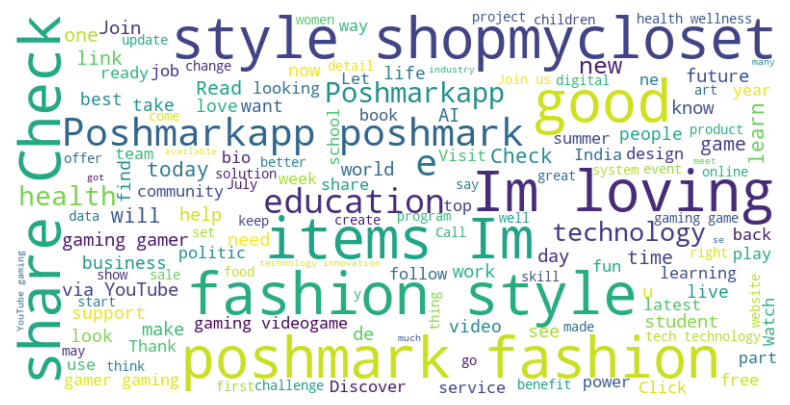

In [50]:
text = ' '.join(eda_dataset['tweet_text'])


# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white',
                      max_font_size=60, min_font_size=10, colormap='viridis',
                      contour_width=2, contour_color='steelblue',
                      stopwords=STOPWORDS).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Plot the wordcloud by categorry wise

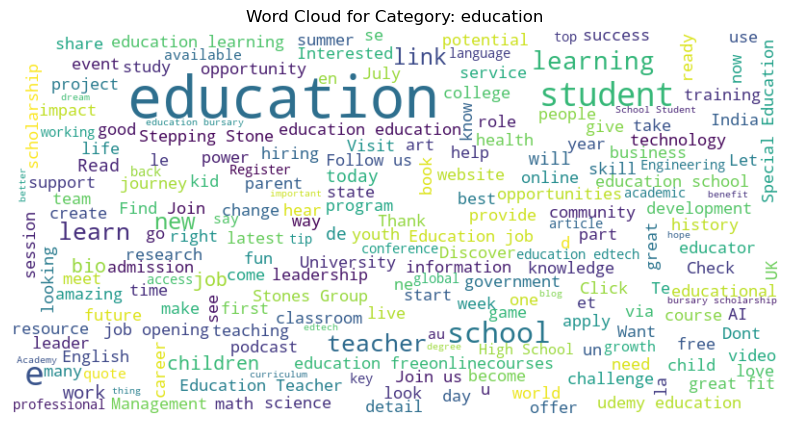

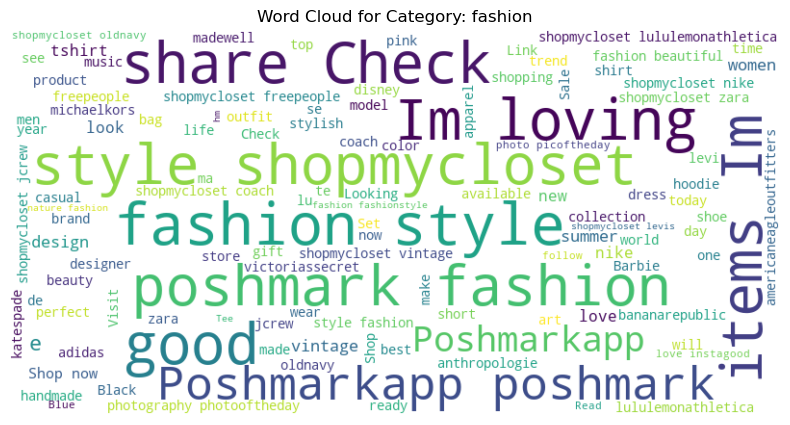

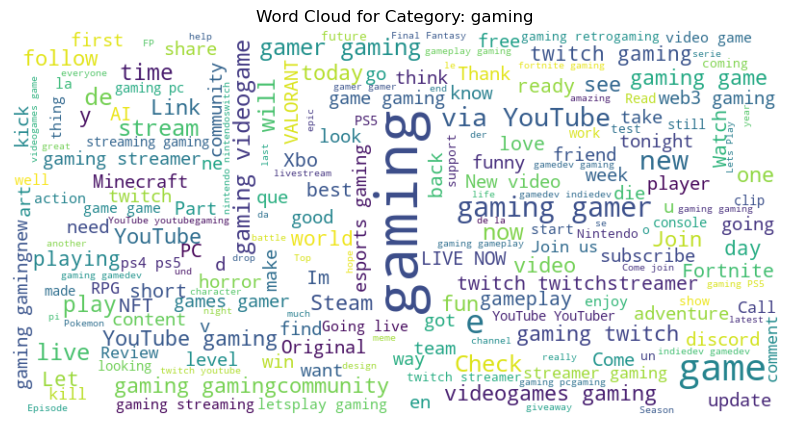

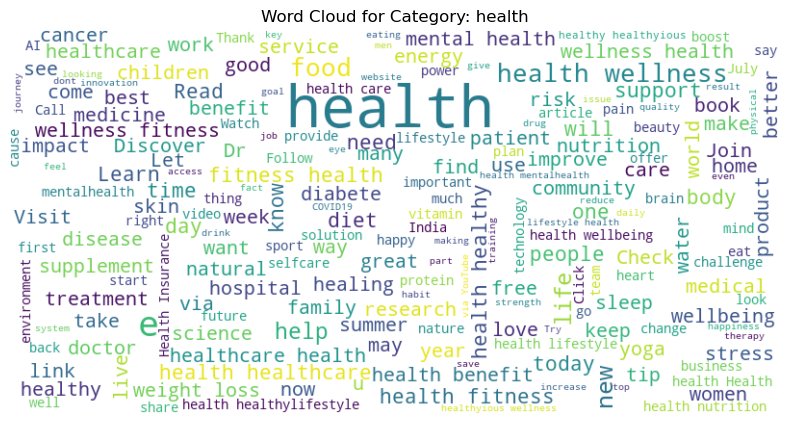

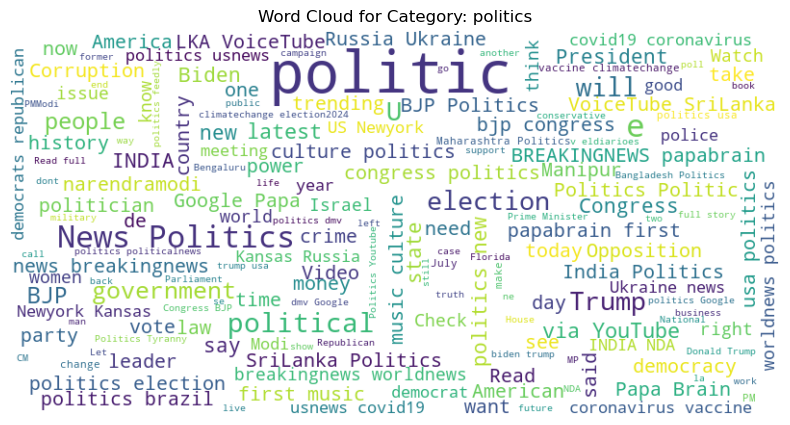

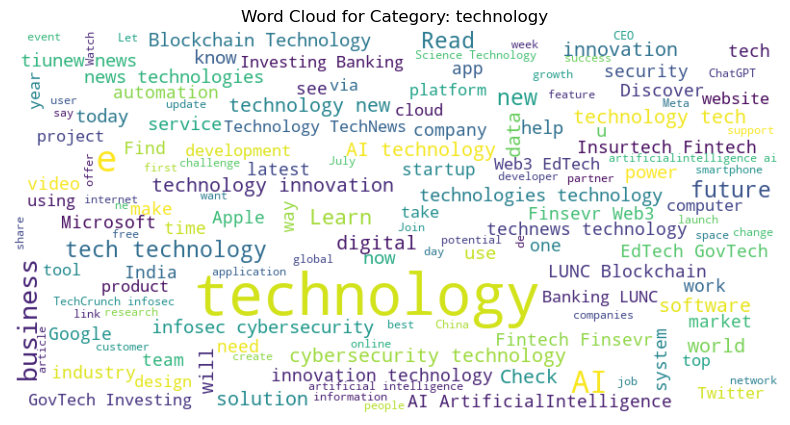

In [51]:
categories = eda_dataset['keyword'].unique()


custom_params = {
    'width': 800,
    'height': 400,
    'background_color': 'white',
    'max_font_size': 60,
    'min_font_size': 10,
    'colormap': 'viridis',
    'contour_width': 2,
    'contour_color': 'steelblue',
    'stopwords': STOPWORDS
}

for category in categories:
    text = ' '.join(eda_dataset[eda_dataset['keyword'] == category]['tweet_text'])
    wordcloud = WordCloud(**custom_params).generate(text)
    
    # Display or save the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Category: {category}')
    plt.axis('off')
    plt.show()

### Correlation between different numerical features

In [52]:
correlation_matrix = eda_dataset.corr()

fig = go.Figure(data=go.Heatmap(
                   z=correlation_matrix.values,
                   x=correlation_matrix.columns,
                   y=correlation_matrix.index,
                   colorscale='Viridis'))

fig.update_layout(
    title='Correblation Matrix of Numeric Data',
    xaxis=dict(title='Features'),
    yaxis=dict(title='Features'),
    width=600, height=600
)

pyo.iplot(fig)

### Distribution of Likes, Comments and Retweets

In [53]:
fig = make_subplots(rows=1, cols=3, subplot_titles=('Likes', 'Retweets', 'Comments'))
numeric_columns = ['like', 'retweet', 'comment']


for i, col in enumerate(numeric_columns):
    fig.add_trace(go.Histogram(x=eda_dataset[col], name=col), row=1, col=i+1)
    fig.update_xaxes(title_text=col, row=1, col=i+1, range=[0, 50])
    fig.update_yaxes(title_text='Frequency', row=1, col=i+1, range=[0, 500])

fig.update_layout(title='Distribution of Likes, Retweets, and Comments')

pyo.iplot(fig)

In [54]:
make_disributions(eda_dataset, 'gaming')

### Percentage of the keywords in dataset. From the pie graph it is concluded that politics keyword frequency is the lowest.

In [55]:
tweet_count_by_keyword = eda_dataset['keyword'].value_counts().reset_index()
tweet_count_by_keyword.columns = ['Keyword', 'TweetCount']

fig = go.Figure(data=[go.Pie(labels=tweet_count_by_keyword["Keyword"], values=tweet_count_by_keyword["TweetCount"], pull=[0, 0, 0, 0, 0, 0.2], title="Keyword Percentage")])
pyo.iplot(fig)

### Check the Total number of tweet as per language. We have around 100k tweet of english keywords so we can drop other language tweets

In [56]:
tweet_count_by_language = eda_dataset['tweet_language'].value_counts().reset_index()
tweet_count_by_language.columns = ['Language', 'TweetCount']

fig = px.bar(tweet_count_by_language, x='Language', y='TweetCount', color='Language',
             labels={'Language': 'Language', 'TweetCount': 'Number of Tweets'},
             title='Number of Tweets counts according to Language',
             color_discrete_sequence=px.colors.qualitative.Dark2)

pyo.iplot(fig)

# Pandas Profiling <a class="anchor" id="11"></a>

In [57]:
profile = pp.ProfileReport(english_dataset)
profile.to_file("Pandas_Profiling.html")

C:\Users\dmaka\anaconda3\envs\Tflow1\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Feature Engineering <a class="anchor" id="12"></a>

### Create the copy of the processed dataset.

In [58]:
featured_dataset = english_dataset.copy()

### After removing non english column So we do not required the tweet_language columns so we can drop that columns.

In [59]:
featured_dataset.drop(["tweet_language"], axis = 1, inplace=True)

In [60]:
featured_dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like
0,1680365782889385985,education,2023-07-15 23:56:00,eskom bursaries 2024 bursaries sa education bu...,0,0,0
1,1680365157539778561,education,2023-07-15 23:54:00,oakland unified school district looking teamma...,0,0,0
2,1680364821517324289,education,2023-07-15 23:52:00,witnessing growth development orphans receive ...,0,0,0
3,1680364098201034754,education,2023-07-15 23:49:00,build stable diffusion ai saas application hel...,0,0,0
4,1680363853543088129,education,2023-07-15 23:48:00,quarter proud equipped 394 atrisk children edu...,0,0,0
...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,new uk law could spark default surveillance ev...,0,0,0
116392,1682903749302566913,technology,2023-07-23 00:01:00,china cloud computing firms raise concern bide...,0,0,0
116393,1682903529743339520,technology,2023-07-23 00:00:00,z3x mst tool free download updated version z3 ...,0,0,1
116394,1682903355658764288,technology,2023-07-23 00:00:00,huaweis bold move strengthening phone market c...,0,0,2


### Perform Lemmatisation and then check the spelling of each and every tweet so we do not get the non existing word.

Lemmatization = Lemmatization is a keyword normalization technique that uses dictionaries or morphological analyzers to break down words into their simplest forms. This method is extremely useful in Natural Language Processing (NLP), as it makes it easier to group related words and improves the precision and effectiveness of various NLP tasks. Lemmatization is also essential for maintaining the inherent meaning and part of speech of words, which enhances contextual comprehension generally in NLP applications. 

In [61]:
featured_dataset['tweet_text'] = featured_dataset['tweet_text'].apply(process_text)

In [62]:
featured_dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like
0,1680365782889385985,education,2023-07-15 23:56:00,sa education scholarship,0,0,0
1,1680365157539778561,education,2023-07-15 23:54:00,oakland unified school district looking teamma...,0,0,0
2,1680364821517324289,education,2023-07-15 23:52:00,witnessing growth development orphan receive e...,0,0,0
3,1680364098201034754,education,2023-07-15 23:49:00,build stable diffusion ai application connecti...,0,0,0
4,1680363853543088129,education,2023-07-15 23:48:00,quarter proud equipped child education practic...,0,0,0
...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,new uk law could spark default surveillance ev...,0,0,0
116392,1682903749302566913,technology,2023-07-23 00:01:00,china cloud computing firm raise concern admin...,0,0,0
116393,1682903529743339520,technology,2023-07-23 00:00:00,tool free download updated version software te...,0,0,1
116394,1682903355658764288,technology,2023-07-23 00:00:00,bold move strengthening phone market chinese c...,0,0,2


### Check the langth of the tweet if the tweet lenght is more than expected then we can remove those tweets as outliers.

The outliers found during the cleaning process were treated using the Flooring and Capping technique to keep tweets with limited length. 

In [63]:
featured_dataset["tweet_length"] = featured_dataset["tweet_text"].apply(lambda x : check_tweet_length(x))

In [64]:
featured_dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like,tweet_length
0,1680365782889385985,education,2023-07-15 23:56:00,sa education scholarship,0,0,0,3
1,1680365157539778561,education,2023-07-15 23:54:00,oakland unified school district looking teamma...,0,0,0,24
2,1680364821517324289,education,2023-07-15 23:52:00,witnessing growth development orphan receive e...,0,0,0,20
3,1680364098201034754,education,2023-07-15 23:49:00,build stable diffusion ai application connecti...,0,0,0,13
4,1680363853543088129,education,2023-07-15 23:48:00,quarter proud equipped child education practic...,0,0,0,15
...,...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,new uk law could spark default surveillance ev...,0,0,0,14
116392,1682903749302566913,technology,2023-07-23 00:01:00,china cloud computing firm raise concern admin...,0,0,0,21
116393,1682903529743339520,technology,2023-07-23 00:00:00,tool free download updated version software te...,0,0,1,9
116394,1682903355658764288,technology,2023-07-23 00:00:00,bold move strengthening phone market chinese c...,0,0,2,12


### As per the box plot we have few outliers. The First quantile of the tweet length is 8 and third quantile is 16. We are using Interquartile Range to remove the outlier.

In [65]:
detect_outliers(featured_dataset, "tweet_length")

Number of outliers: 137


In [66]:
featured_dataset = remove_outliers(featured_dataset, "tweet_length")

In [67]:
featured_dataset

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like,tweet_length
0,1680365782889385985,education,2023-07-15 23:56:00,sa education scholarship,0,0,0,3
1,1680365157539778561,education,2023-07-15 23:54:00,oakland unified school district looking teamma...,0,0,0,24
2,1680364821517324289,education,2023-07-15 23:52:00,witnessing growth development orphan receive e...,0,0,0,20
3,1680364098201034754,education,2023-07-15 23:49:00,build stable diffusion ai application connecti...,0,0,0,13
4,1680363853543088129,education,2023-07-15 23:48:00,quarter proud equipped child education practic...,0,0,0,15
...,...,...,...,...,...,...,...,...
116391,1682903811856166912,technology,2023-07-23 00:01:00,new uk law could spark default surveillance ev...,0,0,0,14
116392,1682903749302566913,technology,2023-07-23 00:01:00,china cloud computing firm raise concern admin...,0,0,0,21
116393,1682903529743339520,technology,2023-07-23 00:00:00,tool free download updated version software te...,0,0,1,9
116394,1682903355658764288,technology,2023-07-23 00:00:00,bold move strengthening phone market chinese c...,0,0,2,12


### Check the Total tweets by keywords we can balance the data.

In [68]:
featured_dataset["keyword"].value_counts()

fashion       23995
gaming        23020
technology    15696
education     15235
health        13608
politics       8800
Name: keyword, dtype: int64

### For the politics We have around 8000 data and other keywords data is much more so we need to balance the data to main the equality of the data. We have user sample random method to choose the 8000 data.

In [69]:
key_words = featured_dataset["keyword"].unique()
processed_df = pd.DataFrame()
for i in key_words:
    data = featured_dataset[featured_dataset["keyword"] == i].sample(n=8000)
    processed_df = pd.concat([processed_df, data], axis=0)

In [70]:
processed_df

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like,tweet_length
5228,1681153544307585027,education,2023-07-18 04:06:00,play integral role shaping global education la...,0,0,0,16
12957,1682333350671839233,education,2023-07-21 10:15:00,collaboration drive new discovery check page j...,0,0,0,22
8925,1682076180718010382,education,2023-07-20 17:13:00,interested career sport industry degree sport ...,0,0,1,20
1028,1680955529374633984,education,2023-07-17 15:00:00,college host hope hydrogen event education read,0,0,1,7
6390,1681687544487108610,education,2023-07-19 15:28:00,day work whatever take film location hard hat ...,0,0,1,28
...,...,...,...,...,...,...,...,...
112206,1682436123161665542,technology,2023-07-21 17:03:00,e become aware need cyber resilience security ...,0,0,0,21
109376,1682042081412550658,technology,2023-07-20 14:57:00,wrapping week hustle accelerator thank hustle ...,0,0,2,16
113440,1682816777573609476,technology,2023-07-22 18:15:00,manufacturing business track product leave war...,0,0,0,13
115411,1683155535103655937,technology,2023-07-23 16:42:00,discover power technology gain insight best pr...,0,0,0,17


In [71]:
processed_df["keyword"].value_counts()

education     8000
fashion       8000
gaming        8000
health        8000
politics      8000
technology    8000
Name: keyword, dtype: int64

### As we have select random sample so we need to reset the index so we have one identical index.

In [72]:
processed_df.reset_index(inplace=True)

In [73]:
processed_df

,index,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like,tweet_length
0,5228,1681153544307585027,education,2023-07-18 04:06:00,play integral role shaping global education la...,0,0,0,16
1,12957,1682333350671839233,education,2023-07-21 10:15:00,collaboration drive new discovery check page j...,0,0,0,22
2,8925,1682076180718010382,education,2023-07-20 17:13:00,interested career sport industry degree sport ...,0,0,1,20
3,1028,1680955529374633984,education,2023-07-17 15:00:00,college host hope hydrogen event education read,0,0,1,7
4,6390,1681687544487108610,education,2023-07-19 15:28:00,day work whatever take film location hard hat ...,0,0,1,28
...,...,...,...,...,...,...,...,...,...
47995,112206,1682436123161665542,technology,2023-07-21 17:03:00,e become aware need cyber resilience security ...,0,0,0,21
47996,109376,1682042081412550658,technology,2023-07-20 14:57:00,wrapping week hustle accelerator thank hustle ...,0,0,2,16
47997,113440,1682816777573609476,technology,2023-07-22 18:15:00,manufacturing business track product leave war...,0,0,0,13
47998,115411,1683155535103655937,technology,2023-07-23 16:42:00,discover power technology gain insight best pr...,0,0,0,17


In [74]:
processed_df.drop(["index"], inplace=True, axis=1)

In [75]:
processed_df

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like,tweet_length
0,1681153544307585027,education,2023-07-18 04:06:00,play integral role shaping global education la...,0,0,0,16
1,1682333350671839233,education,2023-07-21 10:15:00,collaboration drive new discovery check page j...,0,0,0,22
2,1682076180718010382,education,2023-07-20 17:13:00,interested career sport industry degree sport ...,0,0,1,20
3,1680955529374633984,education,2023-07-17 15:00:00,college host hope hydrogen event education read,0,0,1,7
4,1681687544487108610,education,2023-07-19 15:28:00,day work whatever take film location hard hat ...,0,0,1,28
...,...,...,...,...,...,...,...,...
47995,1682436123161665542,technology,2023-07-21 17:03:00,e become aware need cyber resilience security ...,0,0,0,21
47996,1682042081412550658,technology,2023-07-20 14:57:00,wrapping week hustle accelerator thank hustle ...,0,0,2,16
47997,1682816777573609476,technology,2023-07-22 18:15:00,manufacturing business track product leave war...,0,0,0,13
47998,1683155535103655937,technology,2023-07-23 16:42:00,discover power technology gain insight best pr...,0,0,0,17


# TF-IDF <a class="anchor" id="13"></a>

Word Vectorization is a technique to map the words from the text to the vector of numbers to find the semantics and similarities between words for predictions. There are two different techniques for text encoding, Bag-of-Words and TF-IDF vectorization. To compare them, they both were implemented. After implementing TF-IDF, the features increased to 20, 837 which was too large in number.

In [76]:
vectorizer = TfidfVectorizer(stop_words='english')

In [77]:
tfidf_matrix = vectorizer.fit_transform(processed_df['tweet_text'])

In [78]:
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())

In [79]:
tfidf_df

,ab,abacus,abandon,abandoned,abandonment,abbas,abbey,abbie,abbott,abbreviation,...,zoo,zookeepers,zoological,zoom,zu,zucchini,zum,zumba,zur,zurich
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
47996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
47997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
47998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Incremental PCA <a class="anchor" id="14"></a>

According to the working of Bag-of-Words and TF-IDF, the dataset columns increases drastically as there will be one column per unique word in the dataset thus, resulting in 17,000 columns in this case. To reduce the number of columns for training and provide precise and important features, a Dimensionality Reduction technique called Principal Component Analysis was implemented.

The execution of PCA initially resulted in MemoryError. Thus, it was required to find an alternative to reduce the dimensions of the TF-IDF result. The covariance matrix is computed in traditional PCA, which can be computationally and memory-intensive for big datasets. On the other hand, incremental PCA processes the data in smaller batches or chunks, making it possible to use it effectively on huge datasets.


In [80]:
batch_size = 1000

ipca = IncrementalPCA(7)

for batch_start in range(0, len(tfidf_df), batch_size):
    batch = tfidf_df[batch_start:batch_start + batch_size]
    ipca.partial_fit(batch)

In [81]:
tfidf_reduced = ipca.transform(tfidf_df)

In [82]:
tfidf_reduced_df = pd.DataFrame(tfidf_reduced)

In [83]:
tfidf_reduced_df

,0,1,2,3,4,5,6
0,-0.104909,-0.080418,0.296162,-0.050660,0.003390,-0.068723,-0.070459
1,-0.060839,-0.051313,0.067097,-0.009644,-0.014493,-0.011993,-0.014220
2,-0.094856,-0.057003,0.092581,0.013135,0.014515,0.007235,0.015711
3,-0.094384,-0.056525,0.150726,-0.014247,0.019034,-0.013766,-0.019938
4,-0.097139,-0.063777,0.129883,-0.021106,0.015995,0.010479,-0.036590
...,...,...,...,...,...,...,...
47995,-0.092115,-0.052596,-0.019833,0.019370,-0.116730,-0.019060,-0.011945
47996,-0.091207,-0.051674,-0.015328,0.010411,-0.095224,-0.011048,0.002163
47997,-0.094507,-0.056747,-0.019584,0.016811,-0.112910,-0.016514,-0.005072
47998,-0.096766,-0.060316,-0.021469,0.024714,-0.138067,-0.012662,-0.008301


# Clustering <a class="anchor" id="15"></a>

## K-Means <a class="anchor" id="15.1"></a>

Since K-Means is a partitioning algorithm that requires to provide the number of clusters, the number of keywords were passed to partition. Each data point is initially allocated at random to one of the K clusters. After that, we calculate each cluster's centroid (which is essentially its centre) and reassign each data point to the cluster with the closest centroid. This procedure is repeated until there is no longer any change in the cluster assignments for any given data point. In this case, the number of clusters are same as the number of unique keywords from the dataset which happens to be six.

In [84]:
num_clusters = 6
kmeans = KMeans(n_clusters=num_clusters, random_state=42, init='k-means++', algorithm = "full")
cluster = kmeans.fit_predict(tfidf_reduced_df)

### We need to reduce the dimensions of the dataset to plot in the 2d graph. So we have used incremental PCA to reduce the features to 2 (X-axis and Y-axis).

In [85]:
batch_size = 1000

ipca_2 = IncrementalPCA(2)

for batch_start in range(0, len(tfidf_reduced_df), batch_size):
    batch = tfidf_reduced_df[batch_start:batch_start + batch_size]
    ipca_2.partial_fit(batch)

tfidf_reduced_2 = ipca_2.transform(tfidf_reduced_df)
tfidf_reduced_2 = pd.DataFrame(tfidf_reduced_2)
tfidf_reduced_2

,0,1
0,-0.105839,0.302920
1,-0.061373,0.083902
2,-0.095444,0.105804
3,-0.095038,0.158676
4,-0.097911,0.142970
...,...,...
47995,-0.092370,0.014269
47996,-0.091524,0.014725
47997,-0.094823,0.015342
47998,-0.097045,0.016897


### Create the dataframe of output and merge with the 2d dataframe to plot the clusters.

In [86]:
sub_df2 = processed_df[['keyword']]

In [87]:
sub_df2

,keyword
0,education
1,education
2,education
3,education
4,education
...,...
47995,technology
47996,technology
47997,technology
47998,technology


In [88]:
cluster_df = pd.Series(cluster)
clusters_df = cluster_df.reset_index()

In [89]:
cluster_df

0        2
1        2
2        2
3        2
4        2
        ..
47995    0
47996    0
47997    0
47998    0
47999    0
Length: 48000, dtype: int32

In [90]:
tfidf_reduced_2 = pd.concat([tfidf_reduced_2,sub_df2, cluster_df], axis=1)

In [91]:
tfidf_reduced_2

,0,1,keyword,0
0,-0.105839,0.302920,education,2
1,-0.061373,0.083902,education,2
2,-0.095444,0.105804,education,2
3,-0.095038,0.158676,education,2
4,-0.097911,0.142970,education,2
...,...,...,...,...
47995,-0.092370,0.014269,technology,0
47996,-0.091524,0.014725,technology,0
47997,-0.094823,0.015342,technology,0
47998,-0.097045,0.016897,technology,0


In [92]:
tfidf_reduced_2.columns = [0,1, 'category', 'cluster']

In [93]:
tfidf_reduced_2

,0,1,category,cluster
0,-0.105839,0.302920,education,2
1,-0.061373,0.083902,education,2
2,-0.095444,0.105804,education,2
3,-0.095038,0.158676,education,2
4,-0.097911,0.142970,education,2
...,...,...,...,...
47995,-0.092370,0.014269,technology,0
47996,-0.091524,0.014725,technology,0
47997,-0.094823,0.015342,technology,0
47998,-0.097045,0.016897,technology,0


### Count the number of tweet as per the predicted cluster. In the clusetr 0 we can see that majority of the points are from technology so we can keep that cluster as technology.

In [94]:
def display_clusters():
    for i in range(len(tfidf_reduced_2["cluster"].unique())):
        print("="*50 + "Cluster {}".format(i) + "="*50)
        print(tfidf_reduced_2[tfidf_reduced_2['cluster'] == i]['category'].value_counts())

        
display_clusters()

==================================================Cluster 0==================================================
technology    7969
health        7958
fashion       3135
education      729
politics       352
gaming         337
Name: category, dtype: int64
==================================================Cluster 1==================================================
fashion    4853
Name: category, dtype: int64
==================================================Cluster 2==================================================
education     7209
technology      18
health           3
politics         3
fashion          2
Name: category, dtype: int64
==================================================Cluster 3==================================================
gaming        7663
technology      13
fashion         10
education        6
health           2
politics         1
Name: category, dtype: int64
==================================================Cluster 4==============================================

### Plot the graph of the clusters

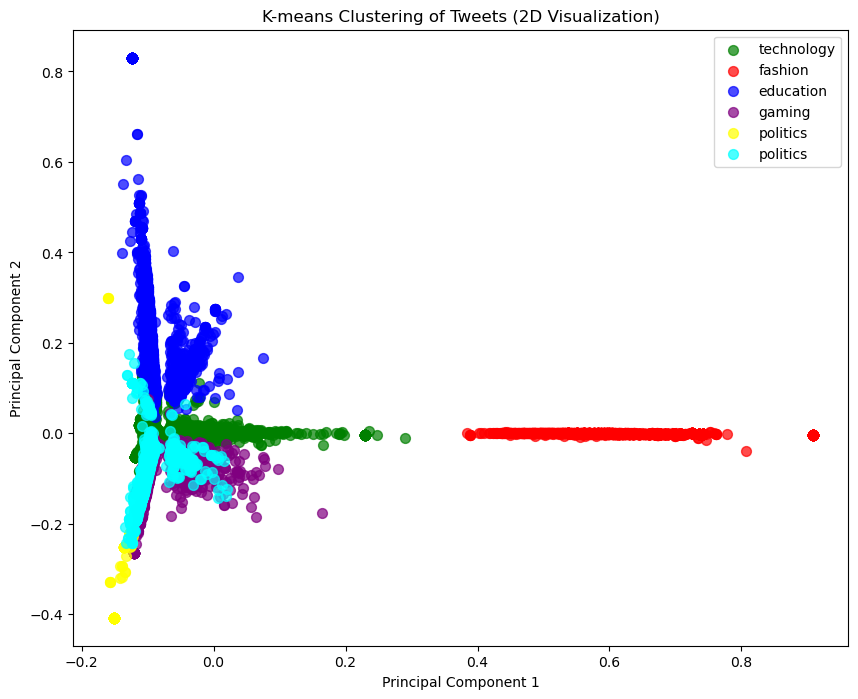

In [95]:
num_clusters = 6
colors = ['green', 'red', 'blue', 'purple', 'yellow', 'cyan']

plt.figure(figsize=(10, 8))
for cluster_num in range(num_clusters):
    cluster_indices = np.where(tfidf_reduced_2['cluster'] == cluster_num)
    cluster_data = tfidf_reduced_2.iloc[list(cluster_indices[0]),:]
    
    label1 = statistics.mode(list(cluster_data['category']))
    plt.scatter(cluster_data.iloc[:, 0], cluster_data.iloc[:, 1], color=colors[cluster_num], s=50, alpha=0.7, label=label1)

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clustering of Tweets (2D Visualization)')
plt.legend()
plt.show()

### Plot 3D graphs of the clusters.

In [96]:
fig = go.Figure()

for cluster_num in range(num_clusters):
    cluster_indices = tfidf_reduced_2[tfidf_reduced_2['cluster'] == cluster_num].index
    cluster_data = tfidf_reduced_2.loc[cluster_indices]
    cluster_names = tfidf_reduced_2.loc[cluster_indices]
    label1 = statistics.mode(list(cluster_data['category']))
    fig.add_trace(go.Scatter3d(
        x=cluster_data.iloc[:, 0],
        y=cluster_data.iloc[:, 1],
        z=[cluster_num] * len(cluster_data),
        mode='markers',
        marker=dict(size=5, color=colors[cluster_num]),
        name=label1
    ))

fig.update_layout(
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Cluster',
    ),
    title='K-means Clustering of Tweets (3D Visualization)',
    legend=dict(
        title='Clusters',
        font=dict(size=10),
        yanchor='top',
        y=0.99,
        xanchor='left',
        x=0.01,
    ),
)

pyo.iplot(fig)

### Merge the output with original dataframe to see the wordcloud of the clustered data.

In [97]:
processed_df_with_cluster = processed_df

In [98]:
pd.DataFrame(cluster_df)

,0
0,2
1,2
2,2
3,2
4,2
...,...
47995,0
47996,0
47997,0
47998,0


In [99]:
processed_df_with_cluster["cluster"] = pd.DataFrame(cluster_df)

In [100]:
processed_df_with_cluster

,tweet_id,keyword,tweet_date,tweet_text,comment,retweet,like,tweet_length,cluster
0,1681153544307585027,education,2023-07-18 04:06:00,play integral role shaping global education la...,0,0,0,16,2
1,1682333350671839233,education,2023-07-21 10:15:00,collaboration drive new discovery check page j...,0,0,0,22,2
2,1682076180718010382,education,2023-07-20 17:13:00,interested career sport industry degree sport ...,0,0,1,20,2
3,1680955529374633984,education,2023-07-17 15:00:00,college host hope hydrogen event education read,0,0,1,7,2
4,1681687544487108610,education,2023-07-19 15:28:00,day work whatever take film location hard hat ...,0,0,1,28,2
...,...,...,...,...,...,...,...,...,...
47995,1682436123161665542,technology,2023-07-21 17:03:00,e become aware need cyber resilience security ...,0,0,0,21,0
47996,1682042081412550658,technology,2023-07-20 14:57:00,wrapping week hustle accelerator thank hustle ...,0,0,2,16,0
47997,1682816777573609476,technology,2023-07-22 18:15:00,manufacturing business track product leave war...,0,0,0,13,0
47998,1683155535103655937,technology,2023-07-23 16:42:00,discover power technology gain insight best pr...,0,0,0,17,0


### From the wordcloud we can easily indentify the domain of the clusters.

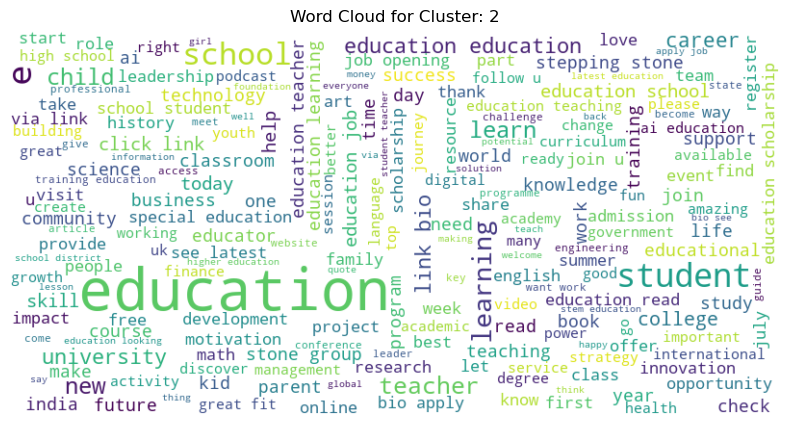

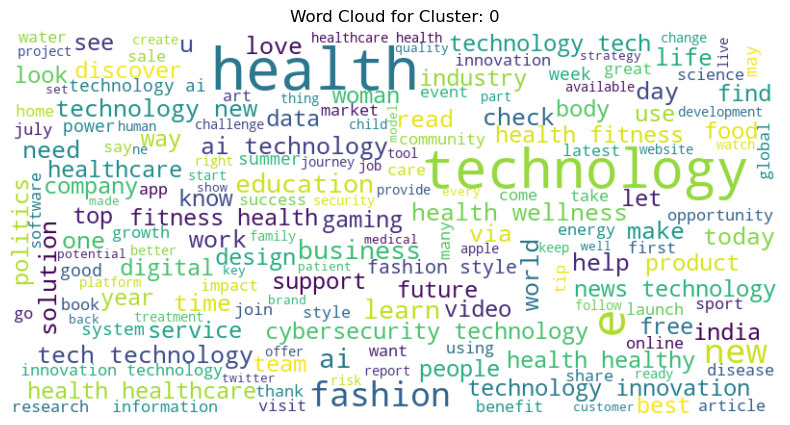

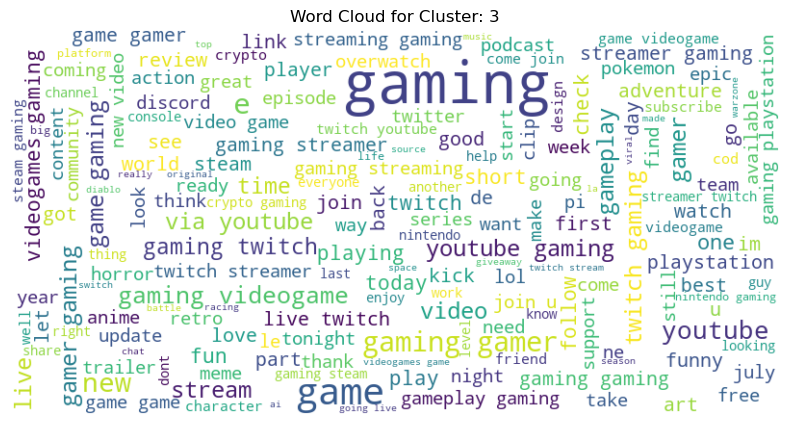

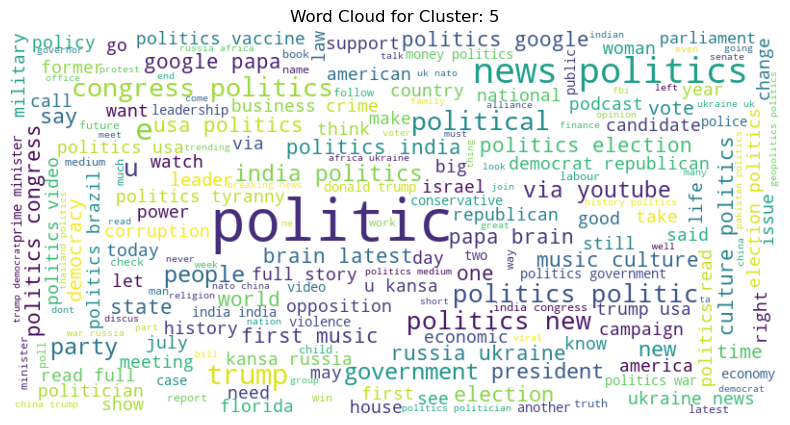

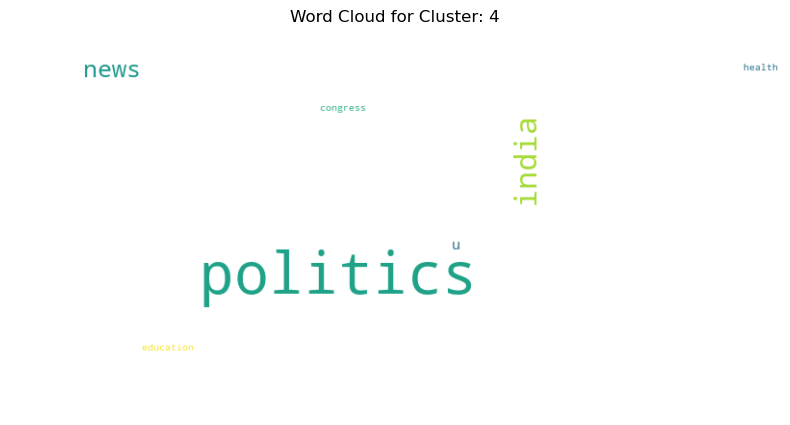

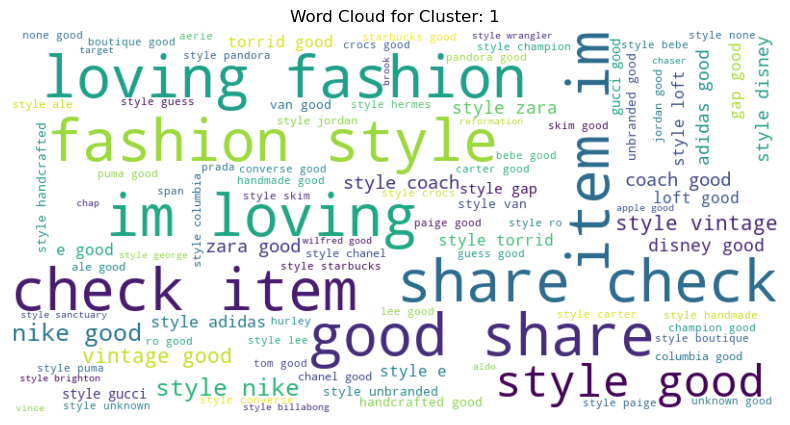

In [101]:
categories = processed_df_with_cluster['cluster'].unique()


custom_params = {
    'width': 800,
    'height': 400,
    'background_color': 'white',
    'max_font_size': 60,
    'min_font_size': 10,
    'colormap': 'viridis',
    'contour_width': 2,
    'contour_color': 'steelblue',
    'stopwords': STOPWORDS
}

for category in categories:
    text = ' '.join(processed_df_with_cluster[processed_df_with_cluster['cluster'] == category]['tweet_text'])
    wordcloud = WordCloud(**custom_params).generate(text)
    
    # Display or save the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster: {category}')
    plt.axis('off')
    plt.show()

## DBSCAN <a class="anchor" id="15.2"></a>

A Density-Based Unsupervised Clustering approach is known as DBSCAN (short for Density Based Spatial Clustering of Applications with Noise). In DBSCAN, clusters are created from dense areas and are divided by sparsely populated areas. DBSCAN does not necessitate initialising the number of clusters, unlike k-means clustering. The minimal number of data points in a given -neighbourhood required to generate clusters (minPts) and the radius of neighbourhoods for a given data point p (eps or ) are the two parameters that DBSCAN needs. The epsilon and min points values for this technique were tweaked with different values to find appropriate number of clusters. The resulting values that gave six number of clusters were with the help of epsilon as 9 and minimum number of samples as 22.

In [102]:
tfidf_reduced_df_dummy = tfidf_reduced_df.copy()

In [103]:
tfidf_reduced_df_dummy

,0,1,2,3,4,5,6
0,-0.104909,-0.080418,0.296162,-0.050660,0.003390,-0.068723,-0.070459
1,-0.060839,-0.051313,0.067097,-0.009644,-0.014493,-0.011993,-0.014220
2,-0.094856,-0.057003,0.092581,0.013135,0.014515,0.007235,0.015711
3,-0.094384,-0.056525,0.150726,-0.014247,0.019034,-0.013766,-0.019938
4,-0.097139,-0.063777,0.129883,-0.021106,0.015995,0.010479,-0.036590
...,...,...,...,...,...,...,...
47995,-0.092115,-0.052596,-0.019833,0.019370,-0.116730,-0.019060,-0.011945
47996,-0.091207,-0.051674,-0.015328,0.010411,-0.095224,-0.011048,0.002163
47997,-0.094507,-0.056747,-0.019584,0.016811,-0.112910,-0.016514,-0.005072
47998,-0.096766,-0.060316,-0.021469,0.024714,-0.138067,-0.012662,-0.008301


In [104]:
Db_scan_cluster = pd.DataFrame()

In [105]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Assuming you have your PCA data in 'pca_data'
# Step 2: Standardize the data
scaler = StandardScaler()
standardized_data = scaler.fit_transform(tfidf_reduced_df_dummy)

# Step 3: Determine Epsilon and MinPts (you can use k-distance plot or elbow method)

# Step 4: Apply DBSCAN
# dbscan = DBSCAN(eps=1.3, min_samples=45)
dbscan = DBSCAN(eps=0.4, min_samples=1400)
clusters = dbscan.fit_predict(standardized_data)

# Step 5: Analyze Results
# Add 'clusters' to your DataFrame, which will contain the labels for each tweet
Db_scan_cluster['cluster'] = clusters

# Now you can analyze the results and associate clusters with categories


In [106]:
Db_scan_cluster['cluster'].unique()

array([-1,  5,  0,  2,  1,  3,  4], dtype=int64)

In [107]:
# Step 5: Evaluate the silhouette score
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(standardized_data, clusters)
print(f'Silhouette Score: {silhouette_avg}')

Silhouette Score: 0.23203042578014374


### Merge keywords and clusters

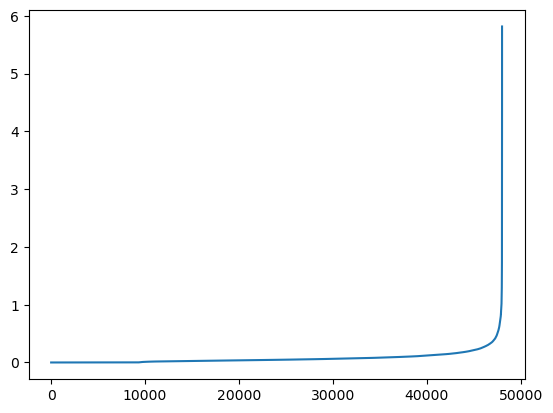

In [108]:
# Step 3: Determine Epsilon and MinPts (use k-distance plot or elbow method)
from sklearn.neighbors import NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=50)
distances, indices = neighbors.fit(standardized_data).kneighbors(standardized_data)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [109]:
Db_scan_cluster['cluster'].value_counts()

-1    17282
 2     9162
 4     5982
 0     5807
 5     4981
 1     2648
 3     2138
Name: cluster, dtype: int64

In [110]:
tfidf_reduced_df_dm = tfidf_reduced_df_dummy.copy()

In [111]:
tfidf_reduced_df_dm['cluster'] = Db_scan_cluster['cluster']
tfidf_reduced_df_dm['category'] = processed_df['keyword']

In [112]:
tfidf_reduced_df_dm

,0,1,2,3,4,5,6,cluster,category
0,-0.104909,-0.080418,0.296162,-0.050660,0.003390,-0.068723,-0.070459,-1,education
1,-0.060839,-0.051313,0.067097,-0.009644,-0.014493,-0.011993,-0.014220,-1,education
2,-0.094856,-0.057003,0.092581,0.013135,0.014515,0.007235,0.015711,-1,education
3,-0.094384,-0.056525,0.150726,-0.014247,0.019034,-0.013766,-0.019938,-1,education
4,-0.097139,-0.063777,0.129883,-0.021106,0.015995,0.010479,-0.036590,-1,education
...,...,...,...,...,...,...,...,...,...
47995,-0.092115,-0.052596,-0.019833,0.019370,-0.116730,-0.019060,-0.011945,2,technology
47996,-0.091207,-0.051674,-0.015328,0.010411,-0.095224,-0.011048,0.002163,2,technology
47997,-0.094507,-0.056747,-0.019584,0.016811,-0.112910,-0.016514,-0.005072,2,technology
47998,-0.096766,-0.060316,-0.021469,0.024714,-0.138067,-0.012662,-0.008301,2,technology


In [113]:
def display_clusters():
    for i in range(len(tfidf_reduced_df_dm["cluster"].unique())):
        print("="*50 + "Cluster {}".format(i) + "="*50)
        print(tfidf_reduced_df_dm[tfidf_reduced_df_dm['cluster'] == i]['category'].value_counts())

        
display_clusters()

==================================================Cluster 0==================================================
health        5791
technology      10
fashion          5
education        1
Name: category, dtype: int64
==================================================Cluster 1==================================================
fashion    2648
Name: category, dtype: int64
==================================================Cluster 2==================================================
technology    6691
fashion       2444
health          12
politics         9
education        4
gaming           2
Name: category, dtype: int64
==================================================Cluster 3==================================================
fashion    2138
Name: category, dtype: int64
==================================================Cluster 4==================================================
gaming        5977
health           2
technology       2
fashion          1
Name: category, dtype: int64
=======

### Plot 2D graphs of the clusters.

In [114]:
tfidf_reduced_2['DB_Cluster'] = Db_scan_cluster['cluster']

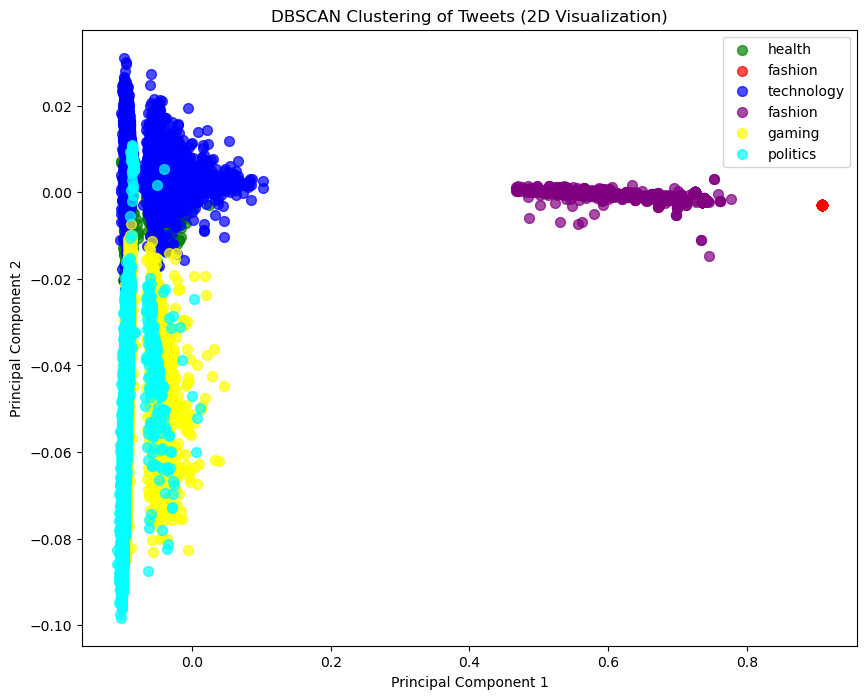

In [115]:
num_clusters = 6
colors = ['green', 'red', 'blue', 'purple', 'yellow', 'cyan']

plt.figure(figsize=(10, 8))
for cluster_num in range(num_clusters):
    cluster_indices = np.where(tfidf_reduced_2['DB_Cluster'] == cluster_num)
    cluster_data = tfidf_reduced_2.iloc[list(cluster_indices[0]),:]
    
    label1 = statistics.mode(list(cluster_data['category']))
    plt.scatter(cluster_data.iloc[:, 0], cluster_data.iloc[:, 1], color=colors[cluster_num], s=50, alpha=0.7, label=label1)

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clustering of Tweets (2D Visualization)')
plt.legend()
plt.show()

### Plot 3D graphs of the clusters.

In [116]:
fig = go.Figure()

for cluster_num in range(num_clusters):
    cluster_indices = tfidf_reduced_2[tfidf_reduced_2['DB_Cluster'] == cluster_num].index
    cluster_data = tfidf_reduced_2.loc[cluster_indices]
    cluster_names = tfidf_reduced_2.loc[cluster_indices]
    label1 = statistics.mode(list(cluster_data['category']))
    fig.add_trace(go.Scatter3d(
        x=cluster_data.iloc[:, 0],
        y=cluster_data.iloc[:, 1],
        z=[cluster_num] * len(cluster_data),
        mode='markers',
        marker=dict(size=5, color=colors[cluster_num]),
        name=label1
    ))

fig.update_layout(
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Cluster',
    ),
    title='DBSCAN Clustering of Tweets (3D Visualization)',
    legend=dict(
        title='Clusters',
        font=dict(size=10),
        yanchor='top',
        y=0.99,
        xanchor='left',
        x=0.01,
    ),
)

pyo.iplot(fig)

In [117]:
processed_df_with_cluster['DB_Cluster'] = Db_scan_cluster['cluster']

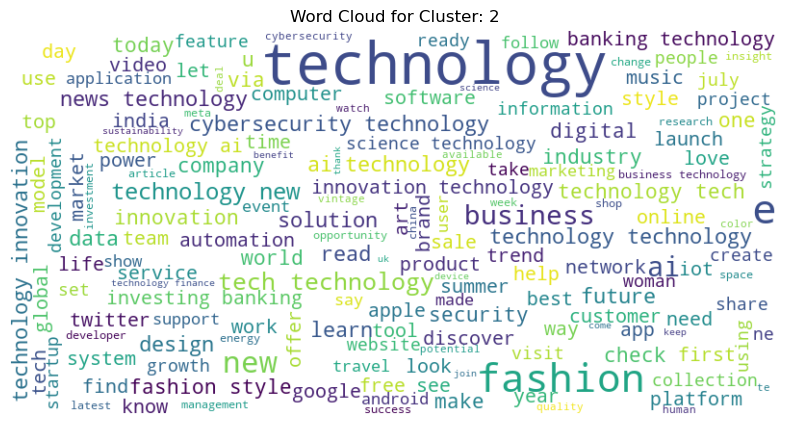

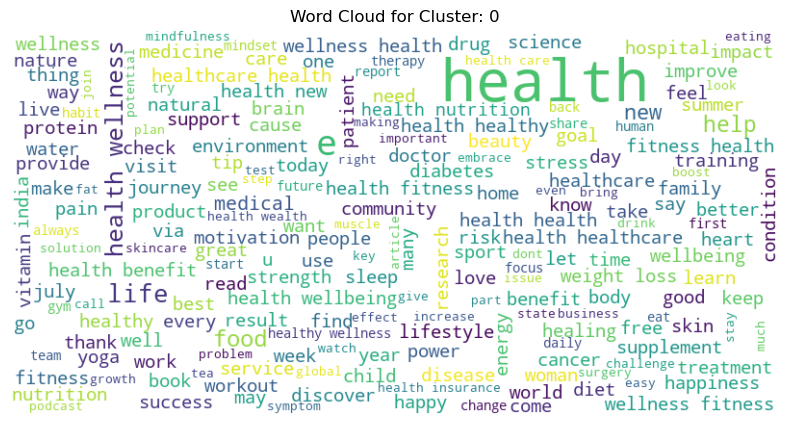

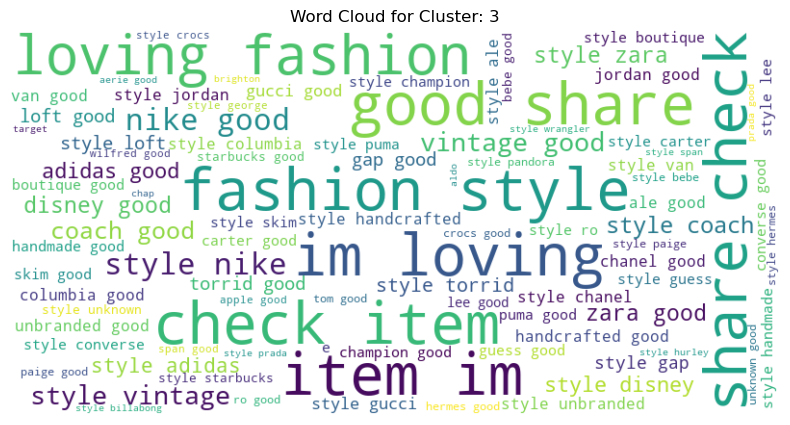

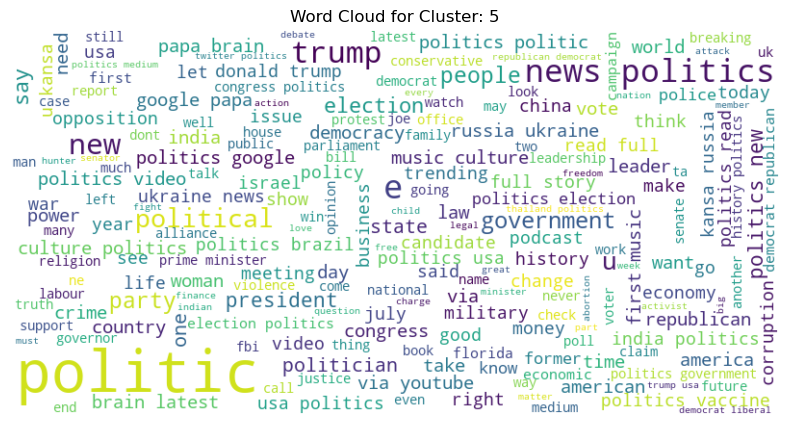

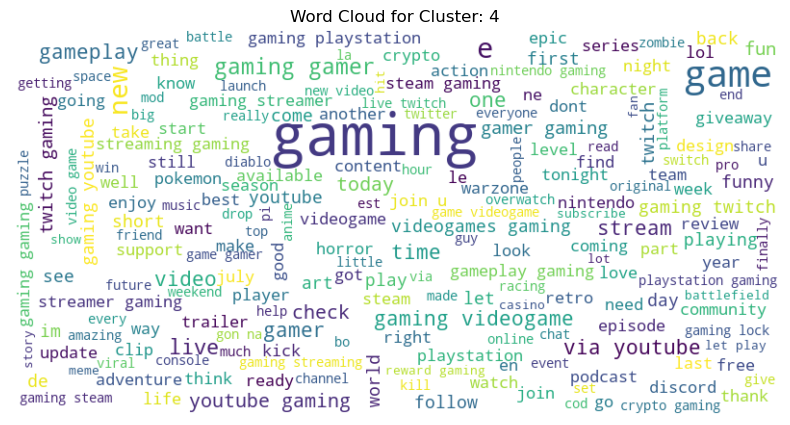

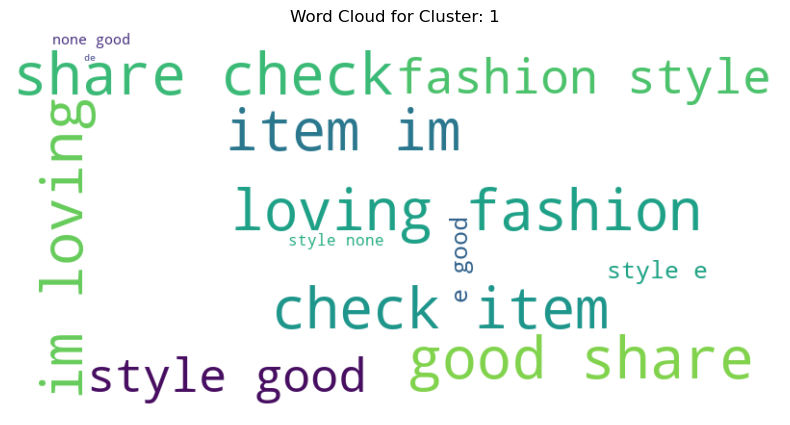

In [118]:
categories = processed_df_with_cluster['cluster'].unique()


custom_params = {
    'width': 800,
    'height': 400,
    'background_color': 'white',
    'max_font_size': 60,
    'min_font_size': 10,
    'colormap': 'viridis',
    'contour_width': 2,
    'contour_color': 'steelblue',
    'stopwords': STOPWORDS
}

for category in categories:
    text = ' '.join(processed_df_with_cluster[processed_df_with_cluster['DB_Cluster'] == category]['tweet_text'])
    wordcloud = WordCloud(**custom_params).generate(text)
    
    # Display or save the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster: {category}')
    plt.axis('off')
    plt.show()

### Possible reasons of poor performance of DBSCAN on our data

*  DBSCAN does not assign explicit cluster labels, as it identifies core, border, and noise points. This lack of cluster labeling might make it harder to interpret the clusters in the context of our Tweet text data
* DBSCAN requires setting the epsilon (eps) and min_samples parameters. The choice of these parameters can significantly impact the clustering results. Finding the optimal values for these parameters has been challenging for our data.
* DBSCAN assumes that clusters have a roughly uniform density. In text data, especially with TF-IDF representation, the distribution of features across documents can be highly uneven, making it challenging for DBSCAN to find well-defined clusters.